# Тематическое моделирование на данных Вконтакте: использование модели LDA, визуализация топиков, построение тематических профилей.

В работе использован код  https://github.com/DmitrySerg/top-russian-music/blob/master/models/clean_visualization.ipynb

## Содержание работы

1. [Загрузка датасета, составление словаря терминов, корпуса документов.](#data)
2. [LDA модель.](#lda)
3. [Визуализация топиков.](#wordcloud)
4. [Тематические профили.](#profiles)
5. [Визуализация профилей с помощью TSNE.](#tsne)

<a id='data'></a>

In [53]:
import re
import pickle
import numpy as np
import pandas as pd
from pprint import pprint

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

from wordcloud import WordCloud  # Пакет для построения облаков слов

# Plotting tools
import seaborn as sns            # Еще один пакет для графиков
import matplotlib.pyplot as plt
%matplotlib inline

import plotly 
from plotly.offline import iplot
import plotly.graph_objs as go

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [5]:
df = pd.read_csv('reduced_comments_vk.csv')

In [6]:
print(df.shape)
df.head(10)

(105377, 16)


,Unnamed: 0,audio,author,comment_id,date,dirty_text,emoji,likes,link,music_style,performer,stickers,text,video,text_bow,comment_len
0,9,NaN,146608415,52228413_282387_282503,2019-01-01 17:43:48,"[id415608045|Иван],\nВ который раз, весь мир л...",NaN,1,NaN,estrada,лепс,NaN,id415608045 иван который весь мир лететь чужое...,NaN,"['id415608045', 'иван', 'который', 'весь', 'ми...",79.0
1,103,NaN,197130573,52228413_282259_282287,2018-12-31 13:47:29,С Наступающим!. Пусть старый год уходя оставит...,NaN,2,NaN,estrada,лепс,NaN,наступать пусть старый год уходить оставить ве...,NaN,"['наступать', 'пусть', 'старый', 'год', 'уходи...",42.0
2,107,NaN,-52228413,52228413_282158_282162,2018-12-30 21:04:56,Автор музыки и слов - Дмитрий Митькин.\n\nВ ко...,NaN,29,NaN,estrada,лепс,NaN,автор музыка слово дмитрий митькина который ве...,NaN,"['автор', 'музыка', 'слово', 'дмитрий', 'митьк...",82.0
3,130,NaN,197130573,52228413_282158_282211,2018-12-30 23:04:28,Ура!!!🔥🔥🔥🔥🔥🔥🔥🔥 Предновогодняя премьера от непо...,🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥👍👍👍👍👍👍👍👍💪💪💪💪💪💪💪💪🔥🔥😎😎😎,6,NaN,estrada,лепс,NaN,ура предновогодний премьера неподражаемый непр...,NaN,"['ура', 'предновогодний', 'премьера', 'неподра...",43.0
4,190,NaN,208434900,52228413_282010_282031,2018-12-29 17:18:25,"Легко. ""Аминь""- лучший клип ГВ за последнее вр...",NaN,4,NaN,estrada,лепс,NaN,легко аминь хороший клип последний время полны...,NaN,"['легко', 'аминь', 'хороший', 'клип', 'последн...",70.0
5,283,NaN,146608415,52228413_281759_281838,2018-12-27 03:22:30,Григорий Лепс - Это стоит\n\nПлачет небо номер...,NaN,25,NaN,estrada,лепс,NaN,григорий лепс это стоить плакать небо номер ме...,григорий лепс это стоить рождество григорий ле...,"['григорий', 'лепс', 'это', 'стоить', 'плакать...",67.0
6,373,NaN,136911996,52228413_281537_281587,2018-12-24 04:30:05,"[id208434900|Валера], есть артист, который пра...",NaN,4,NaN,estrada,лепс,NaN,id208434900 валер артист который практически п...,NaN,"['id208434900', 'валер', 'артист', 'который', ...",48.0
7,378,NaN,136911996,52228413_281537_281621,2018-12-25 03:08:59,"[id153964488|Дима], ты тон смени, пока я тебя ...",NaN,0,NaN,estrada,лепс,NaN,id153964488 дима тон сменить пока огорчить кас...,NaN,"['id153964488', 'дима', 'тон', 'сменить', 'пок...",48.0
8,428,NaN,146608415,52228413_281244_281245,2018-12-20 12:42:41,«Я решил помочь художнику Григорию Гукасову из...,NaN,31,NaN,estrada,лепс,NaN,решить помочь художник григорий гукасова санкт...,NaN,"['решить', 'помочь', 'художник', 'григорий', '...",47.0
9,469,NaN,69588394,52228413_281188_281316,2018-12-20 21:27:57,Повторю уже сказанные многими слова - наверное...,NaN,6,NaN,estrada,лепс,NaN,повторить сказать многий слово наверное один п...,NaN,"['повторить', 'сказать', 'многий', 'слово', 'н...",41.0


In [8]:
from ast import literal_eval
bag_of_words = df.text_bow.apply(literal_eval)

### Добавим биграммы к bag-of-words

In [10]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(bag_of_words, min_count=5, threshold=100) # higher threshold fewer phrases.

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
bigram_mod.save('bigram_mod.pkl')
    
data_words_bigrams = [bigram_mod[w] for w in bag_of_words]

In [11]:
data_words_bigrams[0][:10]

['id415608045',
 'иван',
 'который',
 'весь',
 'мир',
 'лететь',
 'чужое',
 'нога',
 'понять',
 'правда']

### Создадим словарь терминов

In [12]:
id2word = corpora.Dictionary(data_words_bigrams)

In [13]:
len(id2word)

211508

### Фильтрация слов по частоте

In [14]:
id2word.filter_extremes(no_below=3, no_above=0.4, keep_n=3*10**6)

In [15]:
len(id2word)

74971

In [16]:
corpus = [id2word.doc2bow(text) for text in data_words_bigrams]

In [17]:
corpus[0][:10]

[(0, 1),
 (1, 7),
 (2, 1),
 (3, 1),
 (4, 1),
 (5, 1),
 (6, 1),
 (7, 1),
 (8, 2),
 (9, 1)]

<a id='lda'></a>

### Строим LDA модель

In [22]:
lda_model = gensim.models.ldamodel.LdaModel(
    corpus=corpus,
    id2word=id2word,
    num_topics=30, 
    eval_every=20,        
    passes=5
    )

In [23]:
pprint(lda_model.print_topics())

[(3,
  '0.035*"очень" + 0.027*"самый" + 0.026*"спасибо" + 0.023*"который" + '
  '0.021*"весь" + 0.019*"любить" + 0.019*"мой" + 0.017*"просто" + '
  '0.017*"человек" + 0.016*"хороший"'),
 (7,
  '0.032*"видео" + 0.024*"битый" + 0.015*"миша" + 0.015*"левый" + '
  '0.014*"канал" + 0.013*"шансон" + 0.013*"снимать" + 0.012*"мота" + '
  '0.012*"михаил" + 0.010*"любовный"'),
 (22,
  '0.115*"концерт" + 0.024*"билет" + 0.020*"город" + 0.014*"купить" + '
  '0.012*"ария" + 0.011*"москва" + 0.011*"зал" + 0.011*"деньга" + '
  '0.010*"сцена" + 0.009*"цена"'),
 (2,
  '0.354*"группа" + 0.046*"запись" + 0.018*"ребята" + 0.017*"время" + '
  '0.015*"пост" + 0.015*"участник" + 0.014*"этот" + 0.014*"фанат" + '
  '0.013*"поклонник" + 0.012*"который"'),
 (5,
  '0.141*"клип" + 0.112*"новый" + 0.106*"песня" + 0.092*"очень" + '
  '0.038*"ждать" + 0.031*"сильно" + 0.028*"понравиться" + 0.025*"классный" + '
  '0.017*"сюжет" + 0.013*"кадр"'),
 (17,
  '0.158*"http" + 0.149*"com" + 0.146*"https" + 0.025*"www" + 0.024

In [32]:
topics = lda_model.show_topics(num_topics=30, num_words=100,formatted=False)

<a id='wordcloud'></a>

### Визуализация топиков

In [33]:
def plotWordCloud(topic_number):
    """
        Строит визуализацию слов на основе текстов топиков
    """
    # получаем частоты и слова топика
    
    text = dict(topics[topic_number][1])
    
    # строим облако слов
    wordcloud = WordCloud(background_color="white", max_words=100, width=900, height=900, collocations=False)
    wordcloud = wordcloud.generate_from_frequencies(text)
    plt.figure(figsize=(15, 10))
    plt.title("Топик номер {}".format(topic_number))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");

C:\Users\dinak\anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


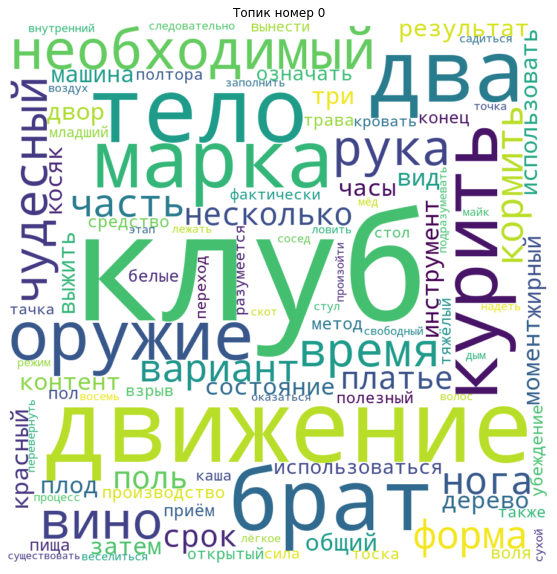

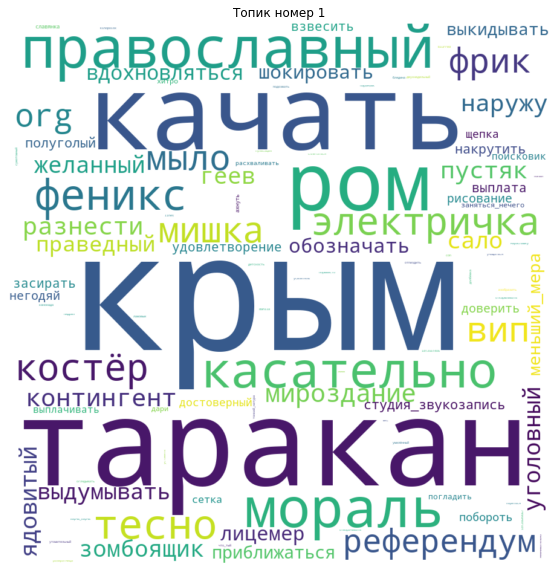

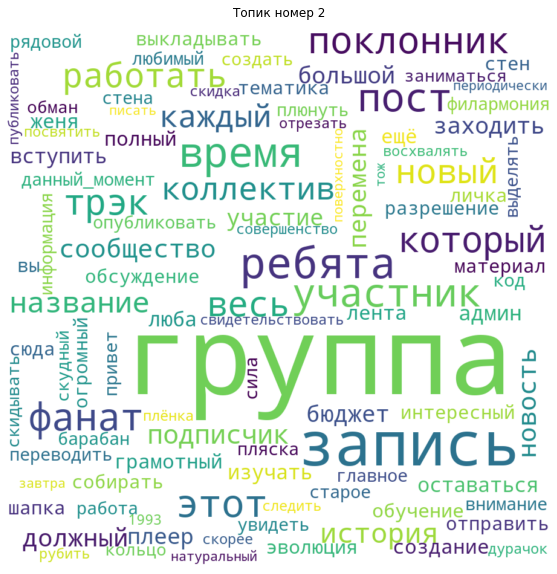

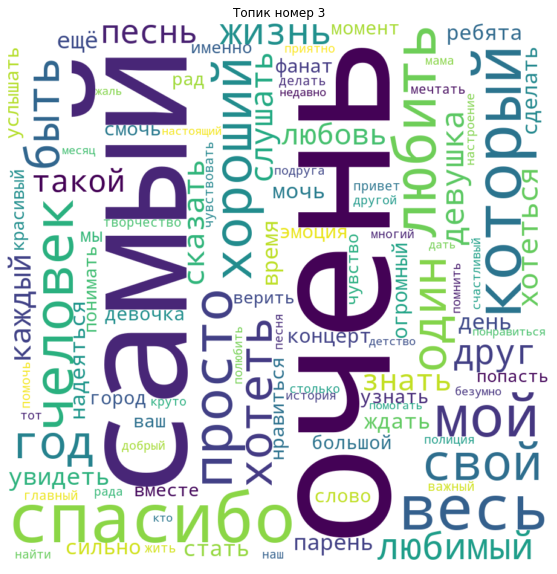

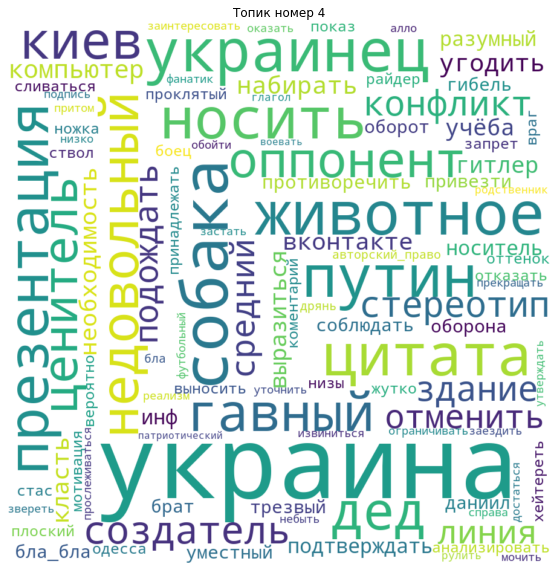

...

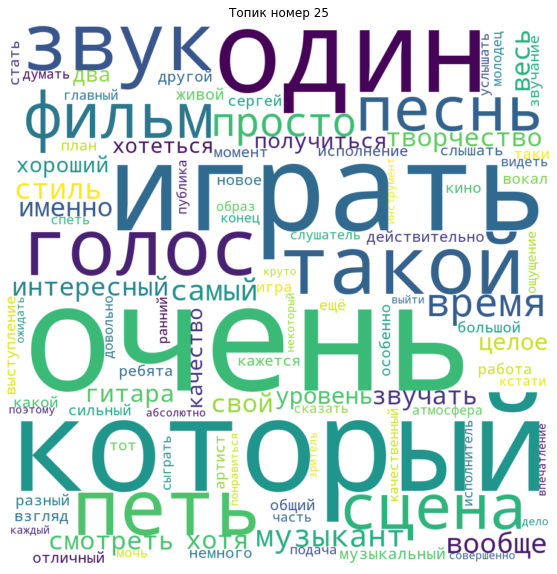

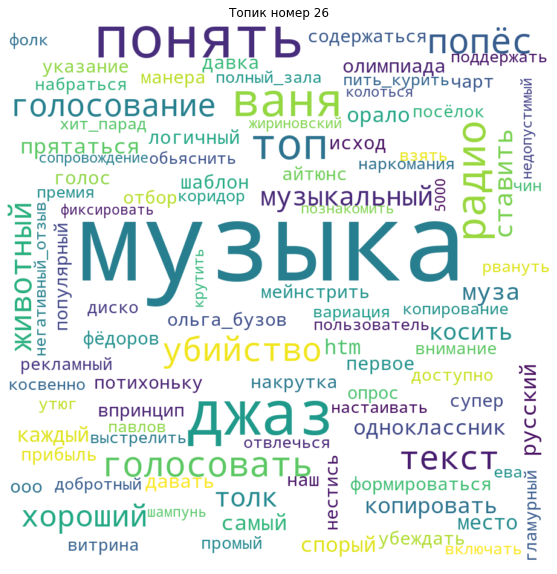

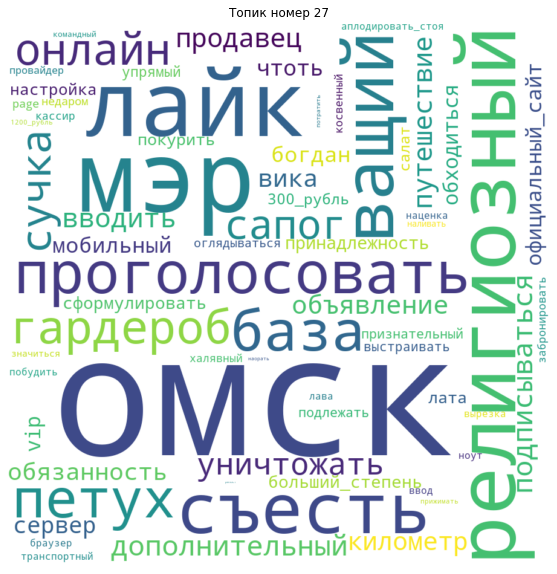

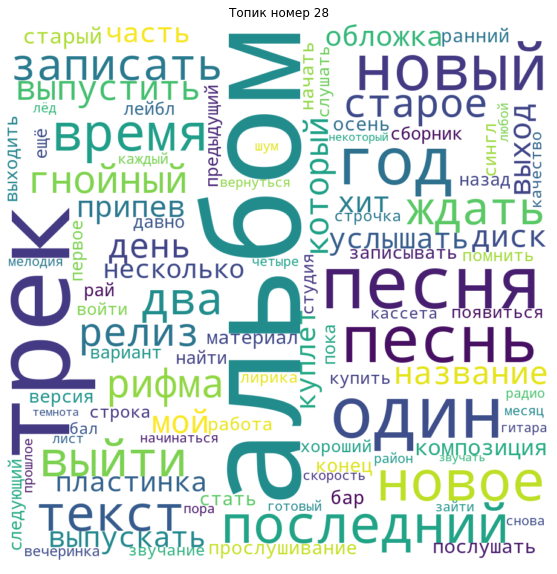

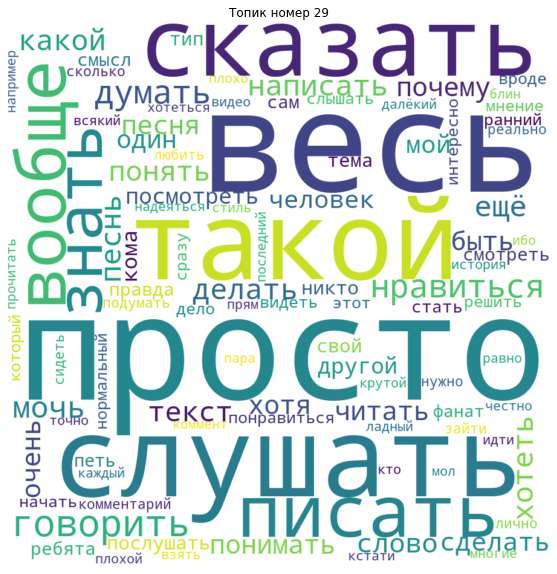

In [36]:
for i in range(30):
    plotWordCloud(topic_number=i)

In [81]:
themes_30 = {
     0 : 'неинтерпретируемая',         1 : 'политика, Украина-Россия', 
     2 : 'группа - запись и пр.',            3 : 'Позитив и благодарности',
     4 : 'Украина',        5 : 'новые клипы и песни',          
     6 : 'Россия',   7 : 'Видео, съемки?',
     8 : 'деньги',                  9 : 'анекдоты',       
     10: 'баттлы, Тимати?',            11: 'благодарности',
     12: 'ссылки на youtube',                        13: 'Павлодар - форум?', 
     14: 'Политика',                      15:'Человек и общество',  
     16: 'Баста и рок?',                    17: 'веб-ссылки',
     18: 'Тексты попсовых песен',                           19: 'Музыкальные туры по годам',
     20: 'Егор Крид',                      21: 'Религия - вопросы жизни и смерти',     
     22: 'покупка билетов на концерт',                      23: 'Вопрос-ответ',
     24: 'Россия на международном музыкальном Фестивале',     25: 'Восторги по поводу исполнения',   
     26: 'Джаз - понять музыку',                             27: 'Омск - местный форум?',
     28: 'новые альбомы и песни',                            29: 'размышления - весь, такой, просто слушать писать, какой смысл' 
}

<a id='profiles'></a>

### Тематические профили

In [38]:
df.performer.value_counts()

крид                      14876
ддт                        6843
пугачёва                   4600
кипелов                    3907
кино                       3668
                          ...  
contemporary_classical        4
антоха_мс                     2
михайлов                      2
буйнов                        1
рыцарные_рыцари               1
Name: performer, Length: 134, dtype: int64

In [39]:
df.music_style.value_counts()

popsa      34723
rock       23523
rap        14680
metal      10097
estrada     9166
pank        5169
classic     3906
indi        1634
shanson      871
dance        833
jazz         775
Name: music_style, dtype: int64

In [40]:
from tqdm import tqdm_notebook

In [43]:
def topicProfileGenre(model, music_style, dataset, corpus, genre=True):

    # Тут будем хранить результат
    theme_results = [ ]

    # Какое в модели количество топиков
    r = model.num_topics
    
    # Выбираем из таблицы те строки, которые соовтетствуют текущему жанру
    if genre:
        num = dataset[dataset.music_style == music_style].index.to_numpy()#get_values() 
    else:
        num = dataset[dataset.performer == music_style].index.to_numpy()#.get_values() 
    print(music_style, len(num), num)

    # Вектор для тематического профиля жанра
    theme_profile = np.zeros(r)
    err = 0 # Для записи ошибок

    # Пробежимся по всем любителям текущего жанра
    for i in num:
        try:
            # вытаскиваем тематический профиль текущего юзера
            cur_user_prof = model.get_document_topics(corpus[i])

            # сортируем по номерам тем
            cur_user_prof = sorted(cur_user_prof, key=lambda w: w[0], reverse=True)      

            ind = [cup[0] for cup in cur_user_prof]     # делаем вектор с номерами тем
            prob = np.array([cup[1] for cup in cur_user_prof]) # делаем вектор с весами  
            theme_profile[ind] += prob        # Увеличиваем соответствующие веса
        except:
            err += 1 # Если возникла ошибка, значит профиль битый 

    # Нормируем к единице
    #print('Доля битых профилей для {}:'.format(music_style), err/len(num))
    theme_profile = theme_profile / np.sum(theme_profile)
    theme_profile = list(zip(range(30),theme_profile))
    return theme_profile

In [44]:
music_style_themes = { }
for music_style in tqdm_notebook(df.music_style.unique()):
    
    # Выделяем темы для текущего жанра
    theme = topicProfileGenre(lda_model, music_style, df, corpus)
    
    # Записываем их в словарик:
    music_style_themes[music_style] = theme

estrada 9166 [   0    1    2 ... 9163 9164 9165]
popsa 34723 [ 9166  9167  9168 ... 43886 43887 43888]
rock 23523 [43889 43890 43891 ... 67409 67410 67411]
metal 10097 [67412 67413 67414 ... 77506 77507 77508]
classic 3906 [77509 77510 77511 ... 81412 81413 81414]
rap 14680 [81415 81416 81417 ... 96092 96093 96094]
shanson 871 [96095 96096 96097 96098 96099 96100 96101 96102 96103 96104 96105 96106
 96107 96108 96109 96110 96111 96112 96113 96114 96115 96116 96117 96118
 96119 96120 96121 96122 96123 96124 96125 96126 96127 96128 96129 96130
 96131 96132 96133 96134 96135 96136 96137 96138 96139 96140 96141 96142
 96143 96144 96145 96146 96147 96148 96149 96150 96151 96152 96153 96154
 96155 96156 96157 96158 96159 96160 96161 96162 96163 96164 96165 96166
 96167 96168 96169 96170 96171 96172 96173 96174 96175 96176 96177 96178
 96179 96180 96181 96182 96183 96184 96185 96186 96187 96188 96189 96190
 96191 96192 96193 96194 96195 96196 96197 96198 96199 96200 96201 96202
 96203 96204 9

pank 5169 [ 97741  97742  97743 ... 102907 102908 102909]
dance 833 [102910 102911 102912 102913 102914 102915 102916 102917 102918 102919
 102920 102921 102922 102923 102924 102925 102926 102927 102928 102929
 102930 102931 102932 102933 102934 102935 102936 102937 102938 102939
 102940 102941 102942 102943 102944 102945 102946 102947 102948 102949
 102950 102951 102952 102953 102954 102955 102956 102957 102958 102959
 102960 102961 102962 102963 102964 102965 102966 102967 102968 102969
 102970 102971 102972 102973 102974 102975 102976 102977 102978 102979
 102980 102981 102982 102983 102984 102985 102986 102987 102988 102989
 102990 102991 102992 102993 102994 102995 102996 102997 102998 102999
 103000 103001 103002 103003 103004 103005 103006 103007 103008 103009
 103010 103011 103012 103013 103014 103015 103016 103017 103018 103019
 103020 103021 103022 103023 103024 103025 103026 103027 103028 103029
 103030 103031 103032 103033 103034 103035 103036 103037 103038 103039
 103040 1

In [45]:
# Сохраняем словарик с тематическими профилями 
with open('music_style_themes', 'wb') as f:
    pickle.dump(music_style_themes, f)

In [46]:
performer_themes = { }
for performer in tqdm_notebook(df.performer.unique()):
    
    # Выделяем темы для текущего жанра
    theme = topicProfileGenre(lda_model, performer, df, corpus, genre=False)
    
    # Записываем их в словарик:
    performer_themes[performer] = theme

лепс 914 [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 2

киркоров 846 [6653 6654 6655 6656 6657 6658 6659 6660 6661 6662 6663 6664 6665 6666
 6667 6668 6669 6670 6671 6672 6673 6674 6675 6676 6677 6678 6679 6680
 6681 6682 6683 6684 6685 6686 6687 6688 6689 6690 6691 6692 6693 6694
 6695 6696 6697 6698 6699 6700 6701 6702 6703 6704 6705 6706 6707 6708
 6709 6710 6711 6712 6713 6714 6715 6716 6717 6718 6719 6720 6721 6722
 6723 6724 6725 6726 6727 6728 6729 6730 6731 6732 6733 6734 6735 6736
 6737 6738 6739 6740 6741 6742 6743 6744 6745 6746 6747 6748 6749 6750
 6751 6752 6753 6754 6755 6756 6757 6758 6759 6760 6761 6762 6763 6764
 6765 6766 6767 6768 6769 6770 6771 6772 6773 6774 6775 6776 6777 6778
 6779 6780 6781 6782 6783 6784 6785 6786 6787 6788 6789 6790 6791 6792
 6793 6794 6795 6796 6797 6798 6799 6800 6801 6802 6803 6804 6805 6806
 6807 6808 6809 6810 6811 6812 6813 6814 6815 6816 6817 6818 6819 6820
 6821 6822 6823 6824 6825 6826 6827 6828 6829 6830 6831 6832 6833 6834
 6835 6836 6837 6838 6839 6840 6841 6842 6843 6844 6845 6846 684

лолита 331 [8761 8762 8763 8764 8765 8766 8767 8768 8769 8770 8771 8772 8773 8774
 8775 8776 8777 8778 8779 8780 8781 8782 8783 8784 8785 8786 8787 8788
 8789 8790 8791 8792 8793 8794 8795 8796 8797 8798 8799 8800 8801 8802
 8803 8804 8805 8806 8807 8808 8809 8810 8811 8812 8813 8814 8815 8816
 8817 8818 8819 8820 8821 8822 8823 8824 8825 8826 8827 8828 8829 8830
 8831 8832 8833 8834 8835 8836 8837 8838 8839 8840 8841 8842 8843 8844
 8845 8846 8847 8848 8849 8850 8851 8852 8853 8854 8855 8856 8857 8858
 8859 8860 8861 8862 8863 8864 8865 8866 8867 8868 8869 8870 8871 8872
 8873 8874 8875 8876 8877 8878 8879 8880 8881 8882 8883 8884 8885 8886
 8887 8888 8889 8890 8891 8892 8893 8894 8895 8896 8897 8898 8899 8900
 8901 8902 8903 8904 8905 8906 8907 8908 8909 8910 8911 8912 8913 8914
 8915 8916 8917 8918 8919 8920 8921 8922 8923 8924 8925 8926 8927 8928
 8929 8930 8931 8932 8933 8934 8935 8936 8937 8938 8939 8940 8941 8942
 8943 8944 8945 8946 8947 8948 8949 8950 8951 8952 8953 8954 8955 

билан 713 [14267 14268 14269 14270 14271 14272 14273 14274 14275 14276 14277 14278
 14279 14280 14281 14282 14283 14284 14285 14286 14287 14288 14289 14290
 14291 14292 14293 14294 14295 14296 14297 14298 14299 14300 14301 14302
 14303 14304 14305 14306 14307 14308 14309 14310 14311 14312 14313 14314
 14315 14316 14317 14318 14319 14320 14321 14322 14323 14324 14325 14326
 14327 14328 14329 14330 14331 14332 14333 14334 14335 14336 14337 14338
 14339 14340 14341 14342 14343 14344 14345 14346 14347 14348 14349 14350
 14351 14352 14353 14354 14355 14356 14357 14358 14359 14360 14361 14362
 14363 14364 14365 14366 14367 14368 14369 14370 14371 14372 14373 14374
 14375 14376 14377 14378 14379 14380 14381 14382 14383 14384 14385 14386
 14387 14388 14389 14390 14391 14392 14393 14394 14395 14396 14397 14398
 14399 14400 14401 14402 14403 14404 14405 14406 14407 14408 14409 14410
 14411 14412 14413 14414 14415 14416 14417 14418 14419 14420 14421 14422
 14423 14424 14425 14426 14427 14428 1442

serebro 2339 [33185 33186 33187 ... 35521 35522 35523]
лазарев 470 [35524 35525 35526 35527 35528 35529 35530 35531 35532 35533 35534 35535
 35536 35537 35538 35539 35540 35541 35542 35543 35544 35545 35546 35547
 35548 35549 35550 35551 35552 35553 35554 35555 35556 35557 35558 35559
 35560 35561 35562 35563 35564 35565 35566 35567 35568 35569 35570 35571
 35572 35573 35574 35575 35576 35577 35578 35579 35580 35581 35582 35583
 35584 35585 35586 35587 35588 35589 35590 35591 35592 35593 35594 35595
 35596 35597 35598 35599 35600 35601 35602 35603 35604 35605 35606 35607
 35608 35609 35610 35611 35612 35613 35614 35615 35616 35617 35618 35619
 35620 35621 35622 35623 35624 35625 35626 35627 35628 35629 35630 35631
 35632 35633 35634 35635 35636 35637 35638 35639 35640 35641 35642 35643
 35644 35645 35646 35647 35648 35649 35650 35651 35652 35653 35654 35655
 35656 35657 35658 35659 35660 35661 35662 35663 35664 35665 35666 35667
 35668 35669 35670 35671 35672 35673 35674 35675 35676 35

би_2 2486 [43889 43890 43891 ... 46372 46373 46374]
ленинград 273 [46375 46376 46377 46378 46379 46380 46381 46382 46383 46384 46385 46386
 46387 46388 46389 46390 46391 46392 46393 46394 46395 46396 46397 46398
 46399 46400 46401 46402 46403 46404 46405 46406 46407 46408 46409 46410
 46411 46412 46413 46414 46415 46416 46417 46418 46419 46420 46421 46422
 46423 46424 46425 46426 46427 46428 46429 46430 46431 46432 46433 46434
 46435 46436 46437 46438 46439 46440 46441 46442 46443 46444 46445 46446
 46447 46448 46449 46450 46451 46452 46453 46454 46455 46456 46457 46458
 46459 46460 46461 46462 46463 46464 46465 46466 46467 46468 46469 46470
 46471 46472 46473 46474 46475 46476 46477 46478 46479 46480 46481 46482
 46483 46484 46485 46486 46487 46488 46489 46490 46491 46492 46493 46494
 46495 46496 46497 46498 46499 46500 46501 46502 46503 46504 46505 46506
 46507 46508 46509 46510 46511 46512 46513 46514 46515 46516 46517 46518
 46519 46520 46521 46522 46523 46524 46525 46526 46527 465

арбенина 1761 [64672 64673 64674 ... 66430 66431 66432]
чичерина 30 [66433 66434 66435 66436 66437 66438 66439 66440 66441 66442 66443 66444
 66445 66446 66447 66448 66449 66450 66451 66452 66453 66454 66455 66456
 66457 66458 66459 66460 66461 66462]
несчастный_случай 82 [66463 66464 66465 66466 66467 66468 66469 66470 66471 66472 66473 66474
 66475 66476 66477 66478 66479 66480 66481 66482 66483 66484 66485 66486
 66487 66488 66489 66490 66491 66492 66493 66494 66495 66496 66497 66498
 66499 66500 66501 66502 66503 66504 66505 66506 66507 66508 66509 66510
 66511 66512 66513 66514 66515 66516 66517 66518 66519 66520 66521 66522
 66523 66524 66525 66526 66527 66528 66529 66530 66531 66532 66533 66534
 66535 66536 66537 66538 66539 66540 66541 66542 66543 66544]
смысловые_галлюцинации 157 [66545 66546 66547 66548 66549 66550 66551 66552 66553 66554 66555 66556
 66557 66558 66559 66560 66561 66562 66563 66564 66565 66566 66567 66568
 66569 66570 66571 66572 66573 66574 66575 66576 66577

агата_кристи 83 [67329 67330 67331 67332 67333 67334 67335 67336 67337 67338 67339 67340
 67341 67342 67343 67344 67345 67346 67347 67348 67349 67350 67351 67352
 67353 67354 67355 67356 67357 67358 67359 67360 67361 67362 67363 67364
 67365 67366 67367 67368 67369 67370 67371 67372 67373 67374 67375 67376
 67377 67378 67379 67380 67381 67382 67383 67384 67385 67386 67387 67388
 67389 67390 67391 67392 67393 67394 67395 67396 67397 67398 67399 67400
 67401 67402 67403 67404 67405 67406 67407 67408 67409 67410 67411]
ария 3024 [67412 67413 67414 ... 70433 70434 70435]
louna 12 [70436 70437 70438 70439 70440 70441 70442 70443 70444 70445 70446 70447]
кипелов 3907 [70448 70449 70450 ... 74352 74353 74354]
stigmata 549 [74355 74356 74357 74358 74359 74360 74361 74362 74363 74364 74365 74366
 74367 74368 74369 74370 74371 74372 74373 74374 74375 74376 74377 74378
 74379 74380 74381 74382 74383 74384 74385 74386 74387 74388 74389 74390
 74391 74392 74393 74394 74395 74396 74397 74398 74399 7

contemporary_classical 4 [81131 81132 81133 81134]
inclassic 15 [81135 81136 81137 81138 81139 81140 81141 81142 81143 81144 81145 81146
 81147 81148 81149]
ludvigvonbeethoven 9 [81150 81151 81152 81153 81154 81155 81156 81157 81158]
petertchaikovsky 115 [81159 81160 81161 81162 81163 81164 81165 81166 81167 81168 81169 81170
 81171 81172 81173 81174 81175 81176 81177 81178 81179 81180 81181 81182
 81183 81184 81185 81186 81187 81188 81189 81190 81191 81192 81193 81194
 81195 81196 81197 81198 81199 81200 81201 81202 81203 81204 81205 81206
 81207 81208 81209 81210 81211 81212 81213 81214 81215 81216 81217 81218
 81219 81220 81221 81222 81223 81224 81225 81226 81227 81228 81229 81230
 81231 81232 81233 81234 81235 81236 81237 81238 81239 81240 81241 81242
 81243 81244 81245 81246 81247 81248 81249 81250 81251 81252 81253 81254
 81255 81256 81257 81258 81259 81260 81261 81262 81263 81264 81265 81266
 81267 81268 81269 81270 81271 81272 81273]
wmozart 141 [81274 81275 81276 81277 81278 8

miyagi&эндшпиль 194 [88387 88388 88389 88390 88391 88392 88393 88394 88395 88396 88397 88398
 88399 88400 88401 88402 88403 88404 88405 88406 88407 88408 88409 88410
 88411 88412 88413 88414 88415 88416 88417 88418 88419 88420 88421 88422
 88423 88424 88425 88426 88427 88428 88429 88430 88431 88432 88433 88434
 88435 88436 88437 88438 88439 88440 88441 88442 88443 88444 88445 88446
 88447 88448 88449 88450 88451 88452 88453 88454 88455 88456 88457 88458
 88459 88460 88461 88462 88463 88464 88465 88466 88467 88468 88469 88470
 88471 88472 88473 88474 88475 88476 88477 88478 88479 88480 88481 88482
 88483 88484 88485 88486 88487 88488 88489 88490 88491 88492 88493 88494
 88495 88496 88497 88498 88499 88500 88501 88502 88503 88504 88505 88506
 88507 88508 88509 88510 88511 88512 88513 88514 88515 88516 88517 88518
 88519 88520 88521 88522 88523 88524 88525 88526 88527 88528 88529 88530
 88531 88532 88533 88534 88535 88536 88537 88538 88539 88540 88541 88542
 88543 88544 88545 88546 88547 

хаски 422 [95513 95514 95515 95516 95517 95518 95519 95520 95521 95522 95523 95524
 95525 95526 95527 95528 95529 95530 95531 95532 95533 95534 95535 95536
 95537 95538 95539 95540 95541 95542 95543 95544 95545 95546 95547 95548
 95549 95550 95551 95552 95553 95554 95555 95556 95557 95558 95559 95560
 95561 95562 95563 95564 95565 95566 95567 95568 95569 95570 95571 95572
 95573 95574 95575 95576 95577 95578 95579 95580 95581 95582 95583 95584
 95585 95586 95587 95588 95589 95590 95591 95592 95593 95594 95595 95596
 95597 95598 95599 95600 95601 95602 95603 95604 95605 95606 95607 95608
 95609 95610 95611 95612 95613 95614 95615 95616 95617 95618 95619 95620
 95621 95622 95623 95624 95625 95626 95627 95628 95629 95630 95631 95632
 95633 95634 95635 95636 95637 95638 95639 95640 95641 95642 95643 95644
 95645 95646 95647 95648 95649 95650 95651 95652 95653 95654 95655 95656
 95657 95658 95659 95660 95661 95662 95663 95664 95665 95666 95667 95668
 95669 95670 95671 95672 95673 95674 9567

шансон 38 [96892 96893 96894 96895 96896 96897 96898 96899 96900 96901 96902 96903
 96904 96905 96906 96907 96908 96909 96910 96911 96912 96913 96914 96915
 96916 96917 96918 96919 96920 96921 96922 96923 96924 96925 96926 96927
 96928 96929]
шуфутинский 36 [96930 96931 96932 96933 96934 96935 96936 96937 96938 96939 96940 96941
 96942 96943 96944 96945 96946 96947 96948 96949 96950 96951 96952 96953
 96954 96955 96956 96957 96958 96959 96960 96961 96962 96963 96964 96965]
best_jazz 182 [96966 96967 96968 96969 96970 96971 96972 96973 96974 96975 96976 96977
 96978 96979 96980 96981 96982 96983 96984 96985 96986 96987 96988 96989
 96990 96991 96992 96993 96994 96995 96996 96997 96998 96999 97000 97001
 97002 97003 97004 97005 97006 97007 97008 97009 97010 97011 97012 97013
 97014 97015 97016 97017 97018 97019 97020 97021 97022 97023 97024 97025
 97026 97027 97028 97029 97030 97031 97032 97033 97034 97035 97036 97037
 97038 97039 97040 97041 97042 97043 97044 97045 97046 97047 97048 97

тараканы 894 [100340 100341 100342 100343 100344 100345 100346 100347 100348 100349
 100350 100351 100352 100353 100354 100355 100356 100357 100358 100359
 100360 100361 100362 100363 100364 100365 100366 100367 100368 100369
 100370 100371 100372 100373 100374 100375 100376 100377 100378 100379
 100380 100381 100382 100383 100384 100385 100386 100387 100388 100389
 100390 100391 100392 100393 100394 100395 100396 100397 100398 100399
 100400 100401 100402 100403 100404 100405 100406 100407 100408 100409
 100410 100411 100412 100413 100414 100415 100416 100417 100418 100419
 100420 100421 100422 100423 100424 100425 100426 100427 100428 100429
 100430 100431 100432 100433 100434 100435 100436 100437 100438 100439
 100440 100441 100442 100443 100444 100445 100446 100447 100448 100449
 100450 100451 100452 100453 100454 100455 100456 100457 100458 100459
 100460 100461 100462 100463 100464 100465 100466 100467 100468 100469
 100470 100471 100472 100473 100474 100475 100476 100477 100478 

план_ломоносова 231 [102119 102120 102121 102122 102123 102124 102125 102126 102127 102128
 102129 102130 102131 102132 102133 102134 102135 102136 102137 102138
 102139 102140 102141 102142 102143 102144 102145 102146 102147 102148
 102149 102150 102151 102152 102153 102154 102155 102156 102157 102158
 102159 102160 102161 102162 102163 102164 102165 102166 102167 102168
 102169 102170 102171 102172 102173 102174 102175 102176 102177 102178
 102179 102180 102181 102182 102183 102184 102185 102186 102187 102188
 102189 102190 102191 102192 102193 102194 102195 102196 102197 102198
 102199 102200 102201 102202 102203 102204 102205 102206 102207 102208
 102209 102210 102211 102212 102213 102214 102215 102216 102217 102218
 102219 102220 102221 102222 102223 102224 102225 102226 102227 102228
 102229 102230 102231 102232 102233 102234 102235 102236 102237 102238
 102239 102240 102241 102242 102243 102244 102245 102246 102247 102248
 102249 102250 102251 102252 102253 102254 102255 102256 

нейромонах_феофан 195 [103548 103549 103550 103551 103552 103553 103554 103555 103556 103557
 103558 103559 103560 103561 103562 103563 103564 103565 103566 103567
 103568 103569 103570 103571 103572 103573 103574 103575 103576 103577
 103578 103579 103580 103581 103582 103583 103584 103585 103586 103587
 103588 103589 103590 103591 103592 103593 103594 103595 103596 103597
 103598 103599 103600 103601 103602 103603 103604 103605 103606 103607
 103608 103609 103610 103611 103612 103613 103614 103615 103616 103617
 103618 103619 103620 103621 103622 103623 103624 103625 103626 103627
 103628 103629 103630 103631 103632 103633 103634 103635 103636 103637
 103638 103639 103640 103641 103642 103643 103644 103645 103646 103647
 103648 103649 103650 103651 103652 103653 103654 103655 103656 103657
 103658 103659 103660 103661 103662 103663 103664 103665 103666 103667
 103668 103669 103670 103671 103672 103673 103674 103675 103676 103677
 103678 103679 103680 103681 103682 103683 103684 1036

антоха_мс 2 [104750 104751]
cбпч 33 [104752 104753 104754 104755 104756 104757 104758 104759 104760 104761
 104762 104763 104764 104765 104766 104767 104768 104769 104770 104771
 104772 104773 104774 104775 104776 104777 104778 104779 104780 104781
 104782 104783 104784]
буерак 95 [104785 104786 104787 104788 104789 104790 104791 104792 104793 104794
 104795 104796 104797 104798 104799 104800 104801 104802 104803 104804
 104805 104806 104807 104808 104809 104810 104811 104812 104813 104814
 104815 104816 104817 104818 104819 104820 104821 104822 104823 104824
 104825 104826 104827 104828 104829 104830 104831 104832 104833 104834
 104835 104836 104837 104838 104839 104840 104841 104842 104843 104844
 104845 104846 104847 104848 104849 104850 104851 104852 104853 104854
 104855 104856 104857 104858 104859 104860 104861 104862 104863 104864
 104865 104866 104867 104868 104869 104870 104871 104872 104873 104874
 104875 104876 104877 104878 104879]
электрофорез 50 [104880 104881 104882 1048

In [47]:
# Сохраняем словарик с тематическими профилями 
with open('performer_themes', 'wb') as f:
    pickle.dump(performer_themes, f)

In [50]:
def profilePlot(theme_profile, music_style, themes=themes_30):
    """
    Строит тематическией профиль для каждого жанра
    theme_profile:
        тематический профиль, dict
    music_style: 
        стиль музыки
    themes dict:
        названия тем
    """
    
    theme_profile = theme_profile[music_style]
    sorted_prof = sorted(theme_profile, key=lambda w: w[1], reverse=True)   
    
    # рисуем картинку
    sns.set(font_scale=2)
    plt.subplots(figsize=(30, 40))
    
    prof = np.array([pr[1] for pr in sorted_prof]).reshape(1,-1)
    them = [themes[pr[0]] for pr in sorted_prof]
    
    ax = plt.axes()    
    sns.heatmap(prof, ax = ax, square=True, annot=True, fmt=".2f", linewidths=0.1, 
                 cmap="YlGnBu", cbar=False, yticklabels='', xticklabels=them )
    ax.set_title('Тематический профиль для {}: \n'.format(music_style))
    plt.show()
    

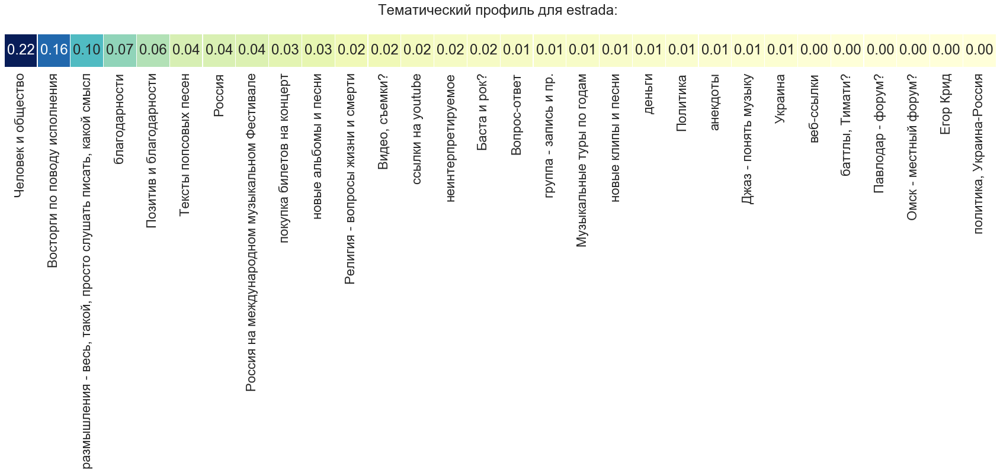

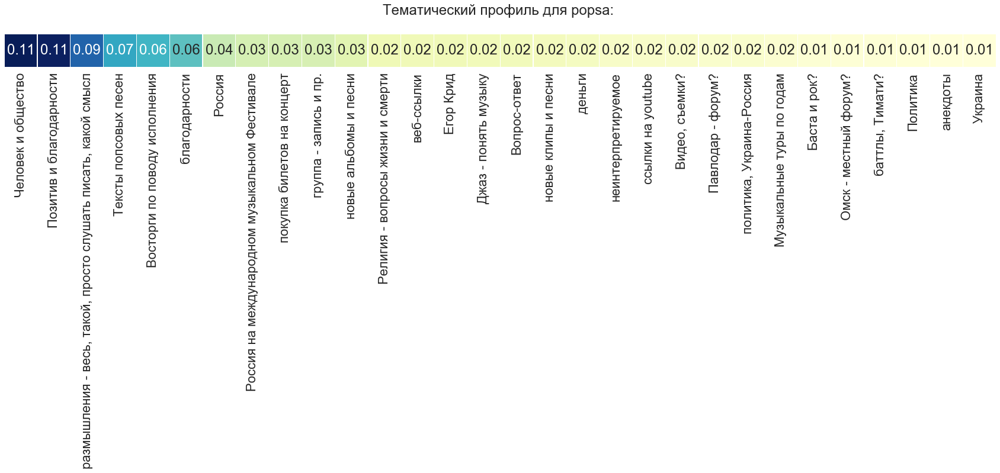

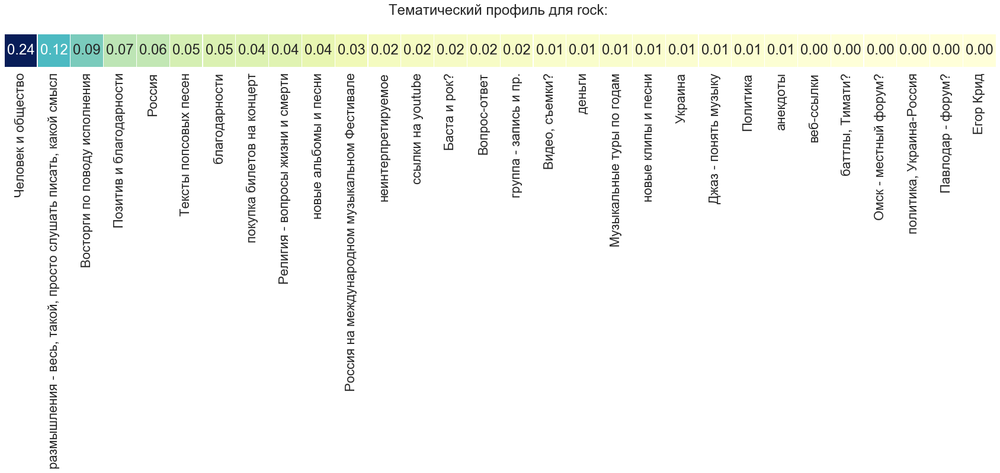

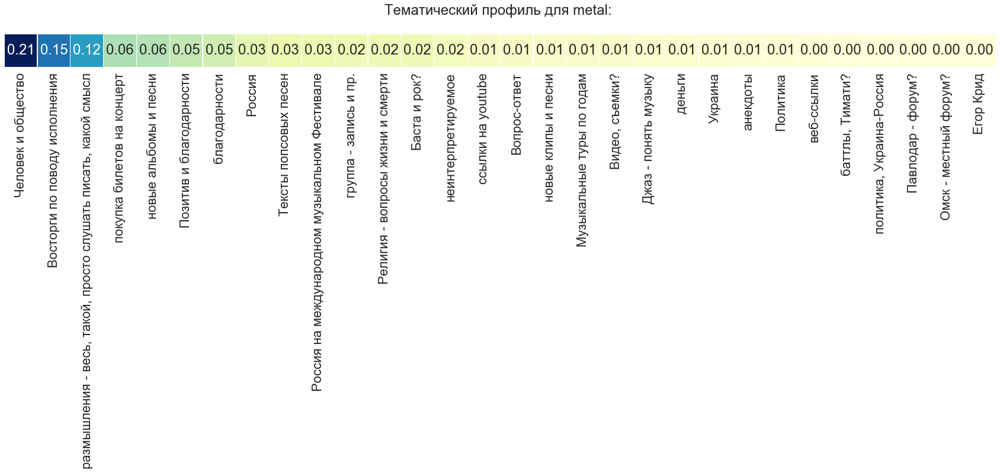

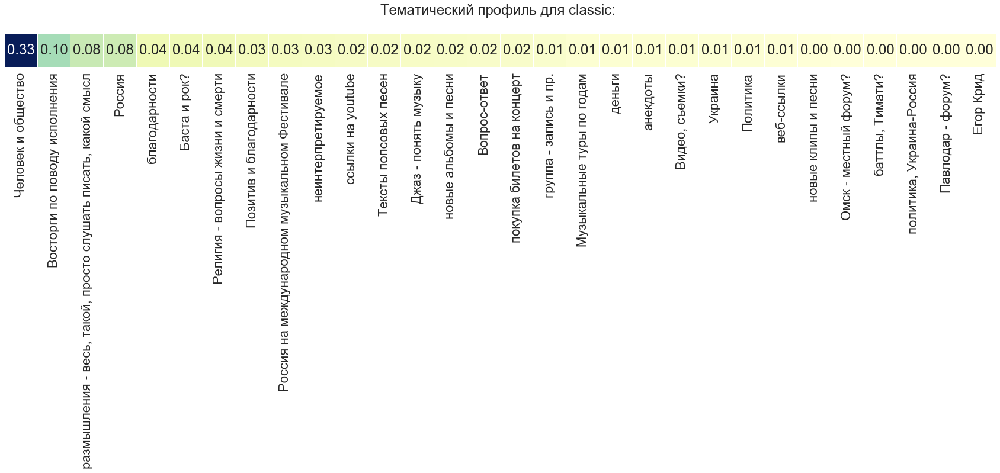

...

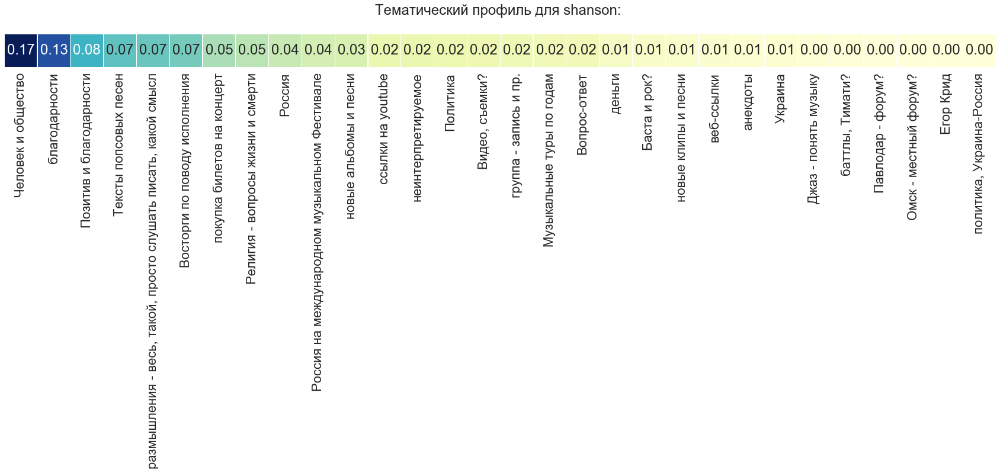

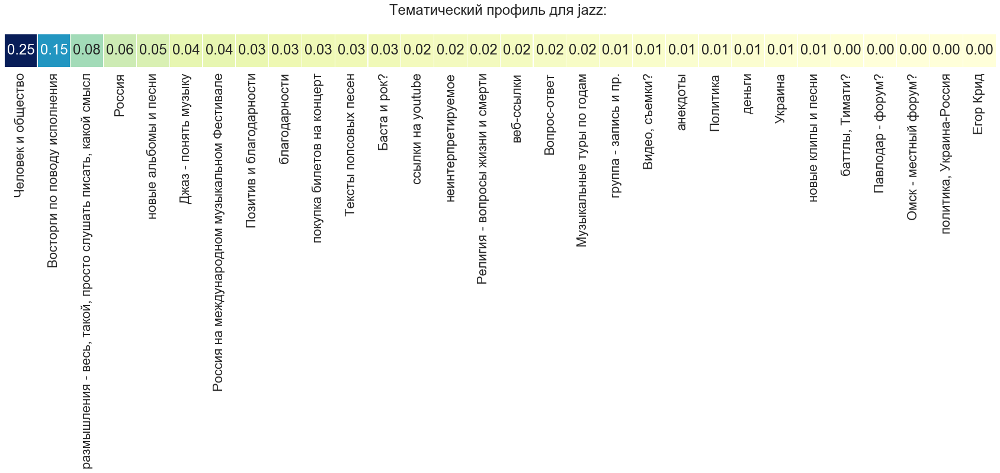

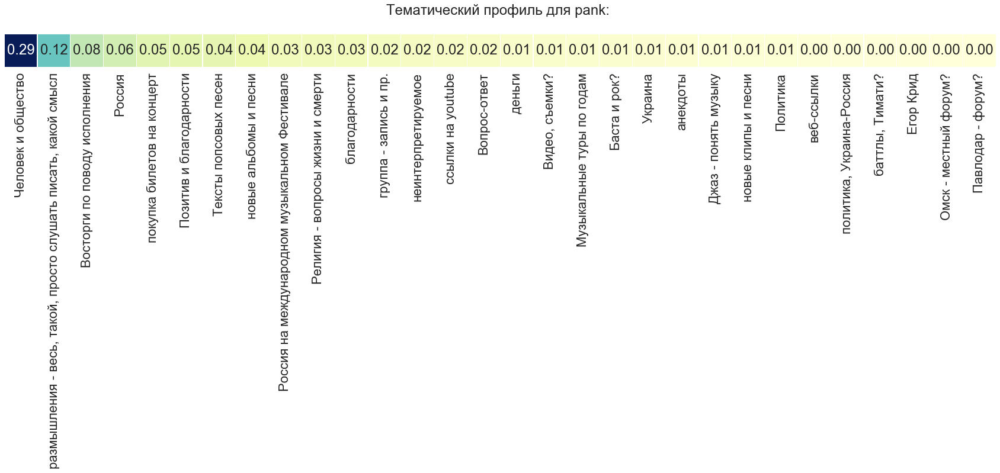

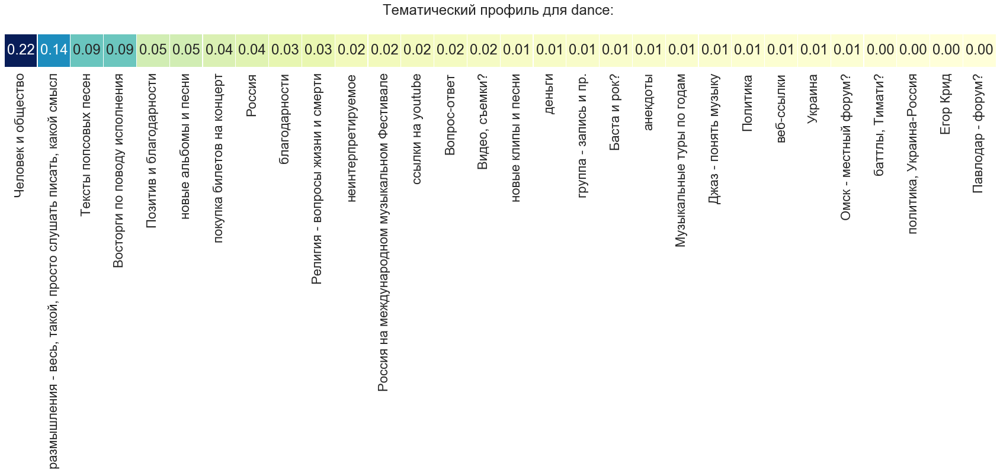

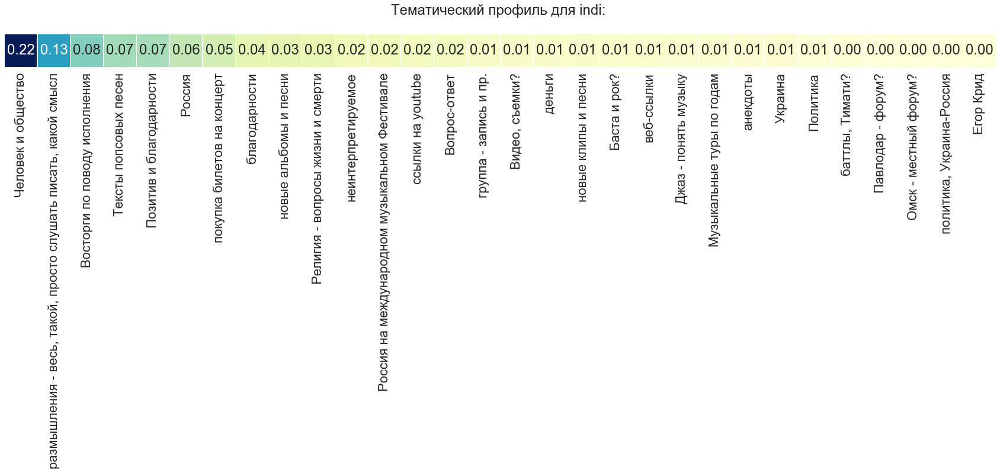

In [54]:
for music_style in df.music_style.unique():
    profilePlot(music_style_themes, music_style)

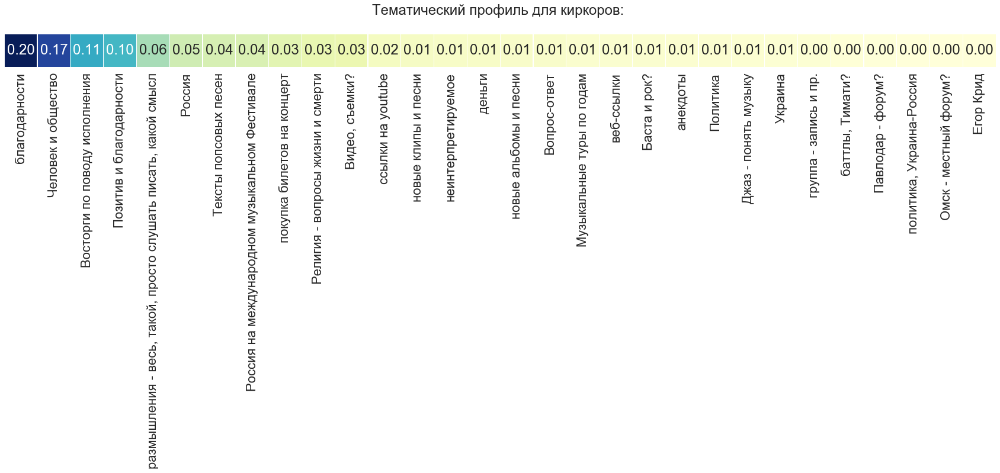

In [56]:
profilePlot(performer_themes, 'киркоров')

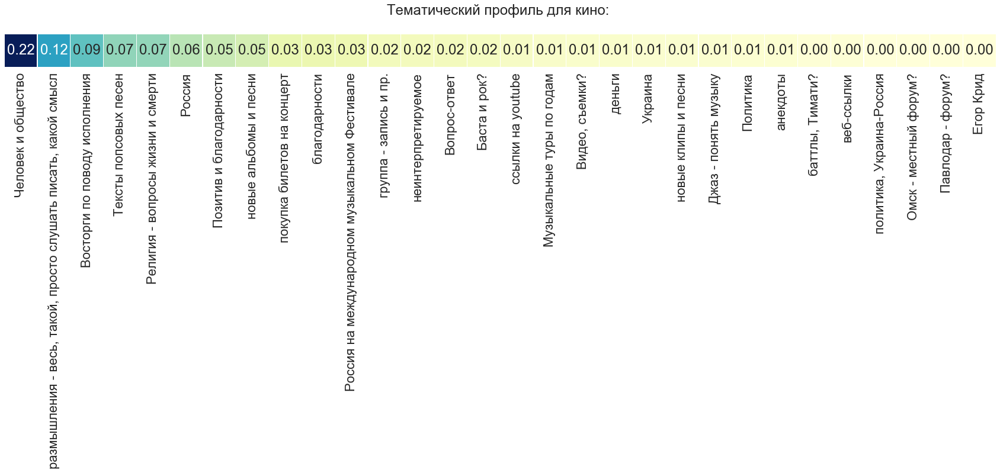

In [57]:
profilePlot(performer_themes, 'кино')

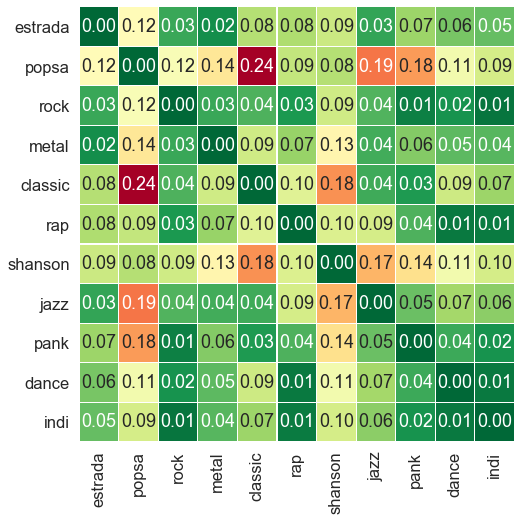

In [59]:
from scipy.spatial.distance import cosine
music_style = list(music_style_themes.keys())
n = len(music_style)  # выясняем число жанров
R = np.zeros((n,n))  # заводим матрицу расстояний 

for i in range(n):
    can_1 = [item[1] for item in music_style_themes[music_style[i]]]     # выделяем вектор для первого 
    for j in range(n):
        can_2 = [item[1] for item in music_style_themes[music_style[j]]] # выделяем второй вектор 
        R[i,j] = cosine(can_1, can_2) # ищем косинусное расстояние
            
sns.set(font_scale=1.5)
plt.subplots(figsize=(8, 8))
sns.heatmap(R, square=True,
            annot=True, fmt=".2f", linewidths=0.1, cmap="RdYlGn_r",
            yticklabels=music_style, xticklabels=music_style,cbar=False);

In [82]:
def get_interpretable_topics(topics, interpretation):
    topics_clean = {}
    
    for key, value in topics.items():
        clean_topics = []
        clean_probs = []
        for topic, prob in value:
            if themes_30[topic]!="неинтерпретируемая":
                clean_topics.append(topic)
                clean_probs.append(prob)

        clean_probs = np.array(clean_probs)/np.sum(clean_probs)

        topics_clean[key] = list(zip(clean_topics, clean_probs))
        
    return topics_clean

In [83]:
music_style_themes_clean = get_interpretable_topics(music_style_themes, themes_30)
performer_themes_clean = get_interpretable_topics(performer_themes, themes_30)

In [84]:
music_style_themes_clusters = {}
for k, v in music_style_themes_clean.items():
    music_style_themes_clusters[k] = [prob[1] for prob in v]
    
music_style_themes_clusters = pd.DataFrame(music_style_themes_clusters).T

<a id='tsne'></a>

### Визуализация TSNE для тематических профилей

In [85]:
tsne = TSNE(n_components=2)
tsne_features = tsne.fit_transform(music_style_themes_clusters)

In [86]:
# Create a trace
trace = go.Scatter(
    x = tsne_features[:, 0],
    y = tsne_features[:, 1],
    mode = 'markers+text',
    text = music_style_themes_clusters.index,
    textposition='top center'
)

data = [trace]

layout = go.Layout(
    autosize=False,
    width=700,
    height=700
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='size-margins')

In [87]:
performer_themes_clusters = {}
for k, v in performer_themes_clean.items():
    performer_themes_clusters[k] = [prob[1] for prob in v]
    
performer_themes_clusters = pd.DataFrame(performer_themes_clusters).T

In [88]:
tsne = TSNE(perplexity=5)
tsne_features = tsne.fit_transform(performer_themes_clusters)

In [89]:
kmeanModel = KMeans(n_clusters=len(music_style_themes.keys())).fit(tsne_features)

In [90]:
# Create a trace
trace = go.Scatter(
    x = tsne_features[:, 0],
    y = tsne_features[:, 1],
    mode = 'markers+text',
    text = performer_themes_clusters.index,
    textfont=dict(
        size=11,
    ),
    textposition='top center',
    marker = dict(
        color=kmeanModel.predict(tsne_features),
        size = 8,
        colorscale='Jet'
    )
)

data = [trace]

layout = go.Layout(
    autosize=False,
    width=1000,
    height=1000,
    xaxis=dict(
        autorange=True,
        showgrid=False,
        zeroline=False,
        showline=False,
        ticks='',
        showticklabels=False
    ),
    yaxis=dict(
        autorange=True,
        showgrid=False,
        zeroline=False,
        showline=False,
        ticks='',
        showticklabels=False
    )
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='performers t-SNE')